# Explore GRS images

## Load python libraries

In [1]:

import glob
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray  # activate the rio accessor
from shapely.geometry import box
import datetime as dt

import hvplot.xarray
import pyproj as ppj

#import cartopy
import cartopy.crs as ccrs
#import cartopy.feature as cfeature
#import locale
#locale.setlocale(locale.LC_ALL, 'en_US.utf8')
import matplotlib.pyplot as plt
import matplotlib as mpl
#mpl.use('TkAgg')


plt.rcParams.update({'font.family': 'Times New Roman',
                     'font.size': 16, 'axes.labelsize': 18,

                     })

rc = {"font.family" : "serif",
      "mathtext.fontset" : "stix"}
plt.rcParams.update(rc)
plt.rcParams["font.serif"] = ["Times New Roman"] + plt.rcParams["font.serif"]

import panel as pn

import grs
import grstbx
from grstbx import visual


u = grstbx.utils
opj = os.path.join


print(f'-grs: {grs.__version__}')
print(f'-grstbx: {grstbx.__version__}')

-grs: 2.2.1
-grstbx: 2.0.2


## HYPERNETS data base

In [2]:
idir='/DATA/hypernets/'
site = 'BEFR' #''BEFR'
files=glob.glob(opj(idir,site,'*','*','*','*','*.nc'))
xr.open_dataset(files[0])

<xarray.Dataset> Size: 65kB
Dimensions:                     (wavelength: 1019, series: 1)
Coordinates:
  * wavelength                  (wavelength) float64 8kB 399.8 400.3 ... 899.4
Dimensions without coordinates: series
Data variables: (12/17)
    bandwidth                   (wavelength) float64 8kB ...
    viewing_azimuth_angle       (series) float64 8B ...
    viewing_zenith_angle        (series) float64 8B ...
    solar_azimuth_angle         (series) float64 8B ...
    solar_zenith_angle          (series) float64 8B ...
    acquisition_time            (series) float64 8B ...
    ...                          ...
    epsilon                     (series) float64 8B ...
    rhof                        (series) float64 8B ...
    fresnel_wind                (series) float64 8B ...
    reflectance_std             (wavelength, series) float64 8kB ...
    water_leaving_radiance_std  (wavelength, series) float64 8kB ...
    reflectance_nosc_std        (wavelength, series) float64 8kB ...
Attributes: (12/55)
    type:                             dataset
    abstract:                         The HYPERNETS project (Horizon 2020 res...
    conventions:                      CFv72, NVS2.0
    format_version:                   v01.0
    netcdf_version:                   1.6
    processor_name:                   hypernets_processor
    ...                               ...
    lineage:                          Quality assured following automated thr...
    creator_name:                     Clémence Goyens (RBINS, OD Nature, REMSEM)
    creator_email:                    https://waterhypernet.org/contact/
    history:                          Reflectance is computed by measuring th...
    site_manager:                     David Doxaran (SU, LOV, France)
    site_manager_email:               david.doxaran@imev-mer.fr

Generate unified NetCDF file with the whole HYPERNETS timeseries (if does not exist)

In [3]:
file = opj('/DATA/hypernets',site,site+'_hypernets.nc')
if not os.path.exists(file):
    Nfile =len(files)
    inc=50
    hypernets = []
    for ii in range(0,Nfile+1,inc):
        print(ii)
        ds = xr.open_mfdataset(files[ii:ii+inc-1],combine="nested",concat_dim='time').squeeze().load()
        ds['time']=pd.to_datetime(ds.acquisition_time.values, unit='s')
        hypernets.append(ds)
    hypernets=xr.concat(hypernets,dim='time')
    hypernets = hypernets.sortby('time')
    hypernets['Rrs']=hypernets.reflectance_nosc/np.pi
    hypernets=hypernets.rename_dims({'wavelength':'wl'}).rename_vars({'wavelength':'wl'})

    hypernets.to_netcdf(file)

hypernets=xr.open_dataset(file)

insitu_param='Rrs'
if site == 'BEFR':
    hypernets['Rrs_corr']=hypernets.reflectance/np.pi
    insitu_param='Rrs_corr'
hypernets

<xarray.Dataset> Size: 138MB
Dimensions:                     (time: 1876, wl: 1019)
Coordinates:
  * wl                          (wl) float64 8kB 399.8 400.3 ... 898.9 899.4
  * time                        (time) datetime64[ns] 15kB 2021-02-24T11:33:4...
Data variables: (12/19)
    bandwidth                   (time, wl) float64 15MB ...
    viewing_azimuth_angle       (time) float64 15kB ...
    viewing_zenith_angle        (time) float64 15kB ...
    solar_azimuth_angle         (time) float64 15kB ...
    solar_zenith_angle          (time) float64 15kB ...
    acquisition_time            (time) float64 15kB ...
    ...                          ...
    fresnel_wind                (time) float64 15kB ...
    reflectance_std             (time, wl) float64 15MB ...
    water_leaving_radiance_std  (time, wl) float64 15MB ...
    reflectance_nosc_std        (time, wl) float64 15MB ...
    Rrs                         (time, wl) float64 15MB ...
    Rrs_corr                    (time, wl) float64 15MB 0.003861 ... 8.443e-05
Attributes: (12/55)
    type:                             dataset
    abstract:                         The HYPERNETS project (Horizon 2020 res...
    conventions:                      CFv72, NVS2.0
    format_version:                   v01.0
    netcdf_version:                   1.6
    processor_name:                   hypernets_processor
    ...                               ...
    lineage:                          Quality assured following automated thr...
    creator_name:                     Clémence Goyens (RBINS, OD Nature, REMSEM)
    creator_email:                    https://waterhypernet.org/contact/
    history:                          Reflectance is computed by measuring th...
    site_manager:                     David Doxaran (SU, LOV, France)
    site_manager_email:               david.doxaran@imev-mer.fr

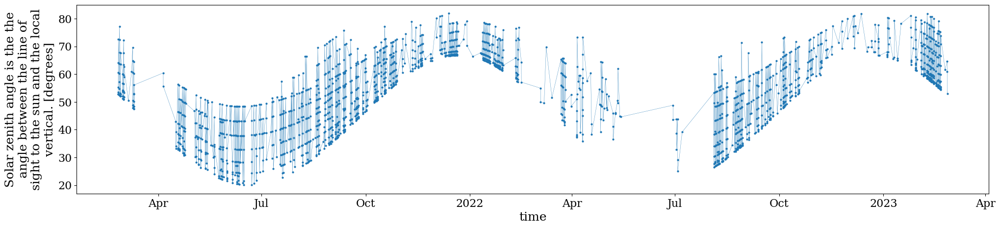

In [4]:

plt.figure(figsize=(24,5))
hypernets.solar_zenith_angle.plot(marker='o',ms=2,lw=0.3)


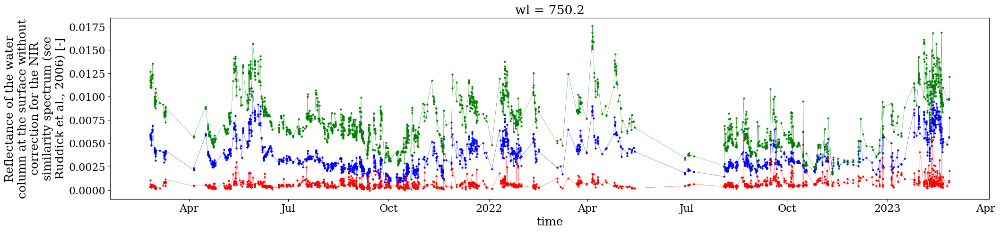

In [5]:

plt.figure(figsize=(24,5))
hypernets.Rrs.sel(wl=450,method='nearest').plot(marker='o',ms=2,lw=0.3,color='blue')
hypernets.Rrs.sel(wl=550,method='nearest').plot(marker='o',ms=2,lw=0.3,color='green')
hypernets.Rrs.sel(wl=750,method='nearest').plot(marker='o',ms=2,lw=0.3,color='red')


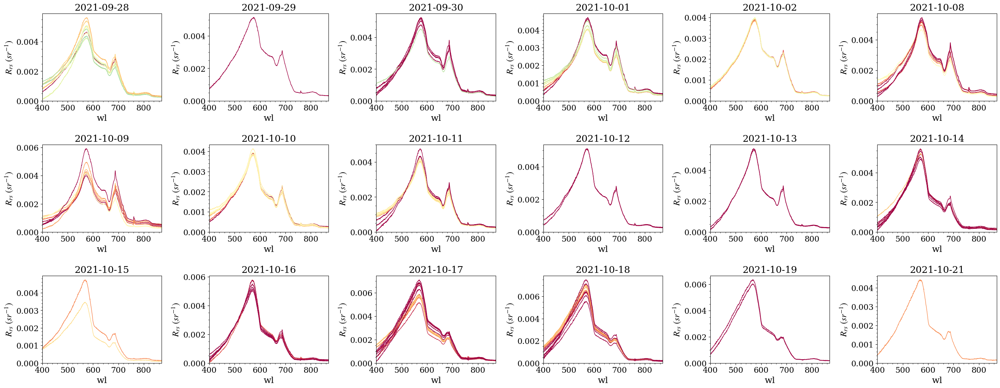

In [6]:
param='Rrs_corr'
hypernets_ = hypernets.sel(time=slice('2021-09-28','2021-10-21'))
dates=np.unique(hypernets_.time.dt.strftime('%Y-%m-%d'))

ncols=6
Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    


cmap = plt.cm.Spectral_r
norm = mpl.colors.LogNorm(vmin=0.1, vmax=800)
norm = mpl.colors.Normalize(vmin=40, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5,4*nrows)) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.5, wspace=0.4)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]


for ii,date in enumerate(dates):
    ax=axs[ii]
    ax.set_axis_on()
    ax.minorticks_on()
    ds = hypernets_.sel(time=date)
    for time,ds_ in ds.groupby('time'):
        sza = ds_.solar_zenith_angle
        ds_[param].plot(color=cmap(norm(sza)),ax=ax,lw=1) #,add_legend=False)
    #(ds.reflectance/np.pi).plot(hue='time',ls=':',ax=ax,add_legend=False)
    ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')
    ax.set_title(str(date))
    ax.set_ylim(0)
    ax.set_xlim(400,870)

Text(0.5, 0.98, 'HYPERNETS, BEFR')

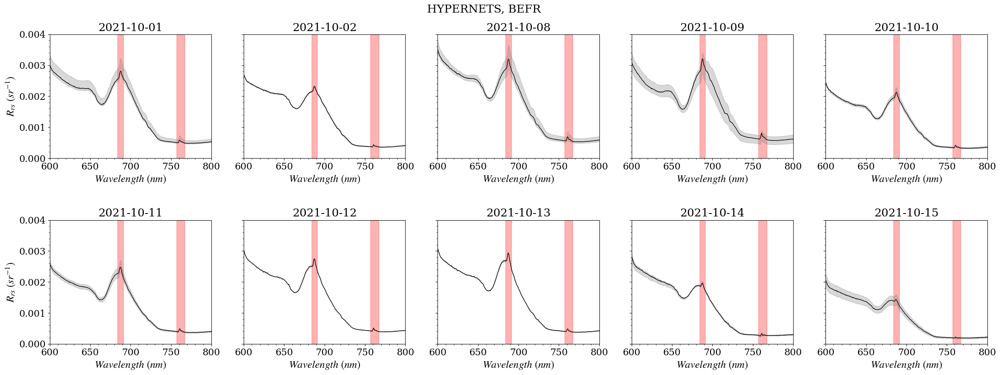

In [7]:
param='Rrs_corr'
hypernets_ = hypernets.sel(time=slice('2021-10-01','2021-10-15'))
dates=np.unique(hypernets_.time.dt.strftime('%Y-%m-%d'))

ncols=5
Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    


cmap = plt.cm.Spectral_r
norm = mpl.colors.LogNorm(vmin=0.1, vmax=800)
norm = mpl.colors.Normalize(vmin=40, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5,4.5*nrows),sharey=True) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.5, wspace=0.2)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs_=axs
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]


for ii,date in enumerate(dates):
    ax=axs[ii]
    ax.set_axis_on()
    ax.minorticks_on()
    ds = hypernets_.sel(time=date)
    avg=ds[param].median('time')
    q20=ds[param].quantile(0.2,'time')
    q80=ds[param].quantile(0.8,'time')
    avg.plot(color='black',ax=ax,lw=1) #,add_legend=False)
    #(ds.reflectance/np.pi).plot(hue='time',ls=':',ax=ax,add_legend=False)
    ax.fill_between(ds.wl, q20,q80,alpha=0.3,color='grey')
    ax.set_ylabel('')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title(str(date))
    ax.set_ylim(0,0.004)
    ax.set_xlim(600,800)
    ax.axvspan(684,691,color="red",alpha=0.3,zorder=-6)
    ax.axvspan(757,767,color="red",alpha=0.3,zorder=-6)
axs_[0,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')
axs_[1,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')

plt.suptitle('HYPERNETS, BEFR')

Text(0.5, 0.98, 'HYPERNETS, BEFR')

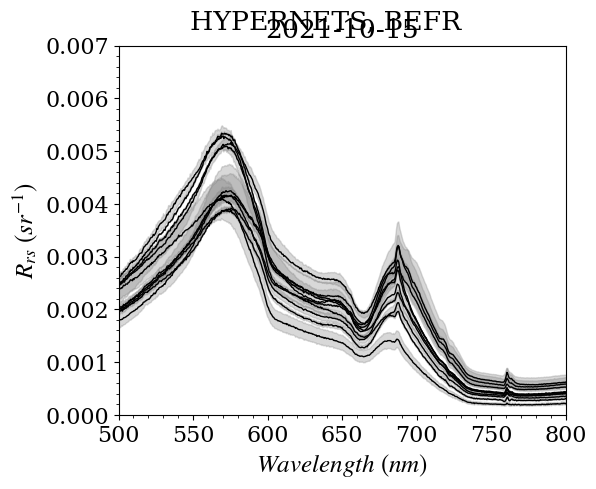

In [8]:
param='Rrs_corr'
hypernets_ = hypernets.sel(time=slice('2021-10-01','2021-10-15'))
dates=np.unique(hypernets_.time.dt.strftime('%Y-%m-%d'))

ncols=1
Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=1#int(np.ceil(Ndates/ncols))    


cmap = plt.cm.Spectral_r
norm = mpl.colors.LogNorm(vmin=0.1, vmax=800)
norm = mpl.colors.Normalize(vmin=40, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*5,4.5*nrows),sharey=True) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.5, wspace=0.2)


ax=axs
for ii,date in enumerate(dates):
    
    ax.set_axis_on()
    ax.minorticks_on()
    ds = hypernets_.sel(time=date)
    avg=ds[param].median('time')
    q20=ds[param].quantile(0.2,'time')
    q80=ds[param].quantile(0.8,'time')
    avg.plot(color='black',ax=ax,lw=1) #,add_legend=False)
    #(ds.reflectance/np.pi).plot(hue='time',ls=':',ax=ax,add_legend=False)
    ax.fill_between(ds.wl, q20,q80,alpha=0.3,color='grey')
    ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title(str(date))
    ax.set_ylim(0,0.007)
    ax.set_xlim(500,800)
plt.suptitle('HYPERNETS, BEFR')

## Create datacube

In [10]:
rootdir ='/data/satellite/Sentinel-2/subset/hypernets/L2A_v22/'
dcdir = '/data/satellite/Sentinel-2/subset/hypernets/datacube/'
tile=site
suffix='_matchup'
start_year,end_year=2018,2024

In [33]:
# subset from center location and width/height

height,width=1500,1500
clon,clat=hypernets.attrs['site_longitude'], hypernets.attrs['site_latitude']   
ust = grstbx.SpatioTemp()
box = ust.wktbox(clon, clat, width=width, height=height, ellps='WGS84')
bbox = gpd.GeoSeries.from_wkt([box]).set_crs(epsg=4326)

In [34]:
pattern='*L2A*'
datadir = opj(rootdir, tile, '*', '*', '*', pattern)#,'*[0-9].nc')
list_files = glob.glob(datadir)
list_files
file_labels=['satellite','level','time','baseline','orbit','tile','processing_time']
indexes = ['time','satellite','tile','level','baseline','orbit','processing_time']
basenames = pd.Series([os.path.basename(p) for p in list_files])  # ,columns=['basename']) #basenames
df = basenames.str.split('_', expand=True)
df.columns=file_labels
df['path']=list_files
df['time'] = pd.to_datetime(df['time'])
df=df.set_index(indexes).sort_index(level=0)
df

,,,,,,,path
time,satellite,tile,level,baseline,orbit,processing_time,
2021-01-07 10:43:29,S2B,T31TFJ,MSIL2A,N0500,R008,20230224T105022,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-01-14 10:33:09,S2B,T31TFJ,MSIL2A,N0500,R108,20230602T210552,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-01-17 10:42:59,S2B,T31TFJ,MSIL2A,N0500,R008,20230606T220703,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-01-19 10:33:51,S2A,T31TFJ,MSIL2A,N0500,R108,20230527T161606,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-01-24 10:32:29,S2B,T31TFJ,MSIL2A,N0500,R108,20230522T093837,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-02-11 10:41:51,S2A,T31TFJ,MSIL2A,N0500,R008,20230608T124831,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-02-13 10:30:39,S2B,T31TFJ,MSIL2A,N0500,R108,20230609T061428,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-02-21 10:40:41,S2A,T31TFJ,MSIL2A,N0500,R008,20230521T152935,/data/satellite/Sentinel-2/subset/hypernets/L2...
2021-02-23 10:29:29,S2B,T31TFJ,MSIL2A,N0500,R108,20230522T075744,/data/satellite/Sentinel-2/subset/hypernets/L2...


In [35]:
start_date='2018-01-01'
end_date='2024-12-31'
files = df[start_date:end_date].values.ravel()
dc_path=opj(dcdir,tile+f'_{start_date}_{end_date}'+suffix+'.nc')
if not os.path.exists(dc_path):
    dc = grstbx.L2grs(files)
    dc.get_l2a_datacube(subset=bbox)
    
    #dc.datacube.to_netcdf(dc_path)

In [36]:
#dcube=xr.open_dataset(dc_path,decode_coords='all')
#dcube

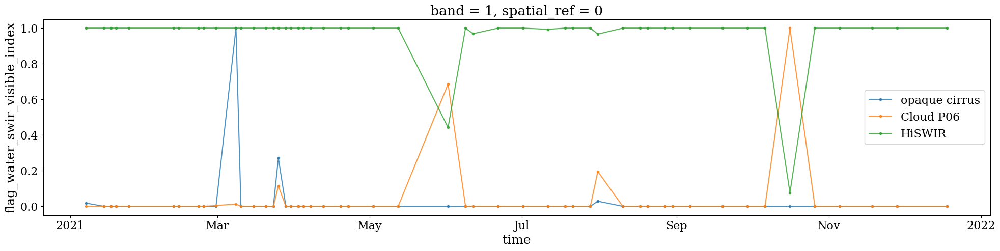

In [37]:
dcube=dc.datacube
alpha=0.8
plt.figure(figsize=(24,5))
dcube.flag_opac_cirrus.plot(marker="o",ms=3,alpha=alpha,label='opaque cirrus')
dcube.flag_cloud_p06.plot(marker="o",ms=3,alpha=alpha,label='Cloud P06')
dcube.flag_water_swir_visible_index.plot(marker="o",ms=3,alpha=alpha,label='HiSWIR')
plt.legend()

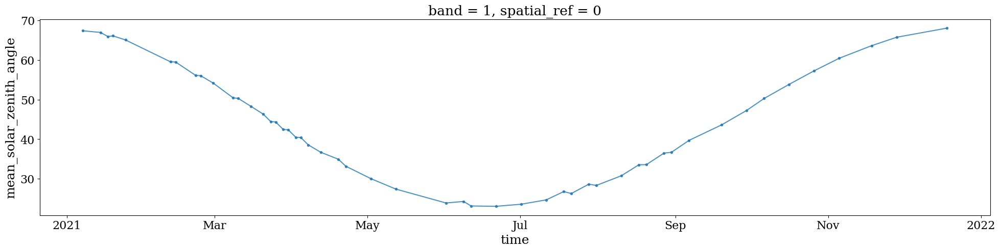

In [38]:
plt.figure(figsize=(24,5))
#dc.datacube.mean_solar_azimuth.plot()
dcube.mean_solar_zenith_angle.plot(marker="o",ms=3,alpha=alpha,label='SZA (deg)')



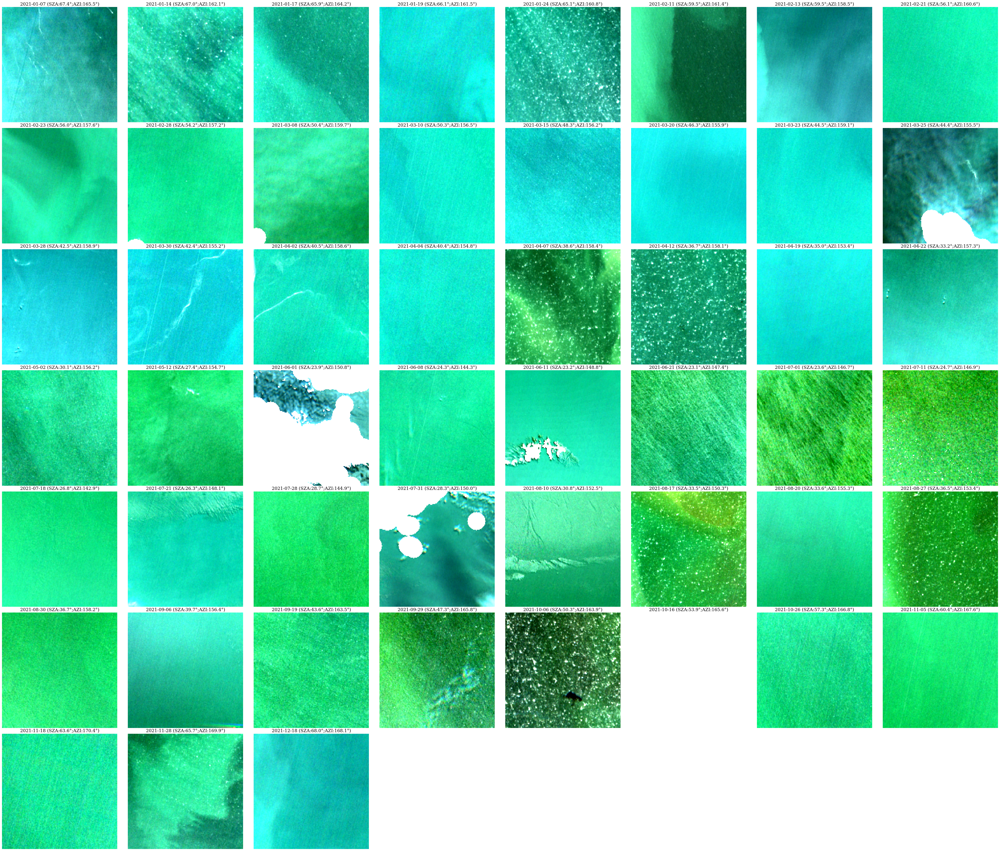

In [39]:
#dcube = dc.datacube

ncols=8


str_epsg = str(dcube.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
alpha=0.5
dates = dcube.time

Ndates = len(dates)
ncols=np.min([ncols,Ndates])
nrows=int(np.ceil(Ndates/ncols))    

fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*7,7*nrows+2.5),subplot_kw={'projection': proj}) 
fig.subplots_adjust(bottom=0.08, top=0.9, left=0.086, right=0.98,
                    hspace=0.05, wspace=0.07,)
if (ncols == 1) & (nrows == 1):
    axs = np.array([axs])
axs=axs.ravel()
[axi.set_axis_off() for axi in axs]

dem = dcube.dem
for ii,date in enumerate(dates):
    raster = dcube.sel(time=date)
    if 'time' in raster.dims:
        raster=raster.mean('time')
    azi =float(raster.mean_solar_azimuth)
    sza=float(raster.mean_solar_zenith_angle)
  
    date_ = date.dt.strftime('%Y-%m-%d').values
    #print(date_)
    #dem_attrs = grstbx.Dem.compute_dem_attributes(dem,sza,azi)
    #dem_attrs.shaded.plot.imshow(ax=axs[ii],robust=True,cmap=plt.cm.Greys_r,vmax=0.75,add_colorbar=False)#,cbar_kwargs={'shrink':0.4})
    
    raster.Rrs.sel(wl=[665,560,490]).where(raster.mask==0).plot.imshow(ax=axs[ii],rgb='wl', robust=True)
   
    axs[ii].set_title(date_+' (SZA:{:.1f}°;AZI:{:.1f}°)'.format(sza,azi),fontsize=16)


In [40]:
dcube=dcube.drop_duplicates('time')

In [19]:
v=visual.ViewSpectral(dcube.Rrs,reproject=True)
v.minmax=[0,0.1]
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2021, ...], start=datetime.date(2021, ..., value=datetime.date(2021, ...)
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.1, name='Range Slider', step=0.0001, value=(0, 0.02), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(DynamicMap, height=800, sizing_mode='fixed', width=1200)

In [43]:
#geom_ = v.get_geom(v.aoi_stream,crs=dcube.rio.crs)

#Rrs_clipped = dcube.Rrs.sel(wl=slice(400,1000)).where(dcube.mask==0).rio.clip(geom_.geometry.values)

In [41]:
dcube=dcube.drop_duplicates('time')
Rrs_clipped = dcube.Rrs.sel(wl=slice(400,1000)).where(dcube.mask==0)

In [42]:
stacked = Rrs_clipped.sel(wl=slice(400,1000)).dropna('time',thresh=0).stack(gridcell=["y", "x"]).dropna('gridcell',thresh=0).compute()
Npix_tot = len(stacked.gridcell)

group_coord ='wl'

stat_coord='gridcell'
time=stacked.time
date=time.dt.floor('1D')
stats = xr.Dataset({'Rrs_median':stacked.groupby(group_coord).median(stat_coord)},
                  coords={'date':date})
stats['Rrs_q25'] = stacked.groupby(group_coord).quantile(0.25,dim=stat_coord)
stats['Rrs_q75'] = stacked.groupby(group_coord).quantile(0.75,dim=stat_coord)
stats['Rrs_min'] = stacked.groupby(group_coord).min(stat_coord)
stats['Rrs_max'] = stacked.groupby(group_coord).max(stat_coord)
stats['Rrs_mean'] = stacked.groupby(group_coord).mean(stat_coord)
stats['Rrs_std'] = stacked.groupby(group_coord).std(stat_coord)
stats['sza'] = dcube.sza.mean('x').mean('y')
stats['aot550'] = dcube.aot550.mean('x').mean('y')
stats['pix_num'] = stacked.count(stat_coord)
stats['rel_pix_num'] =  stats['pix_num'] / Npix_tot
stats['time'] = time
sat_matchup=stats.swap_dims({'time':'date'}).reset_coords('time')

### Normalized in situ Rrs at nadir view and generate the matchup data set

In [43]:
dir_norms= xr.open_dataarray('/DATA/hypernets/dir_norm.nc')
dir_norms=dir_norms.interp(wl=hypernets.wl)
dir_norms

<xarray.DataArray (sza: 75, wl: 1019)> Size: 611kB
array([[       nan,        nan,        nan, ..., 1.12847031, 1.12863078,
        1.12879452],
       [       nan,        nan,        nan, ..., 1.12489841, 1.12505604,
        1.12521688],
       [       nan,        nan,        nan, ..., 1.1213371 , 1.1214919 ,
        1.12164986],
       ...,
       [       nan,        nan,        nan, ..., 0.87968035, 0.87967609,
        0.87967175],
       [       nan,        nan,        nan, ..., 0.87815226, 0.87814691,
        0.87814144],
       [       nan,        nan,        nan, ..., 0.87664079, 0.87663433,
        0.87662775]])
Coordinates:
    var      <U4 16B 'bb_a'
    level    int64 8B 1
    model    <U8 32B 'grow_pow'
  * sza      (sza) int64 600B 5 6 7 8 9 10 11 12 13 ... 72 73 74 75 76 77 78 79
    azi      int64 8B 90
    dataset  <U15 60B 'Ciotti2002_Sf03'
  * wl       (wl) float64 8kB 399.8 400.3 400.8 401.2 ... 898.4 898.9 899.4

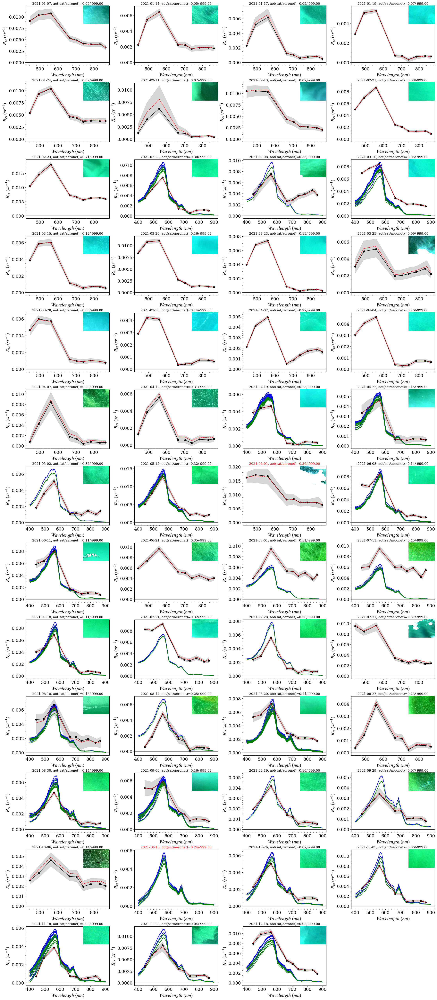

In [44]:
delta_time =  np.timedelta64(4, 'h')
wl_true = [ 442.69104,  492.72842,  559.85376,  664.6208 ,  704.12225,
        740.4838 ,  782.751  ,  832.789  ,  864.7106 ]
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
num_items = len(stats.time)
col_wrap=4
rows=int(np.ceil(num_items/col_wrap))
bands=[3,2,1]

fig, axs = plt.subplots(nrows=rows,ncols=col_wrap, sharex=False, figsize=(col_wrap*6+3, rows*5))#,sharey=True
fig.subplots_adjust(hspace=0.3,wspace=0.3)
axs_ = axs.ravel()
[axi.set_axis_off() for axi in axs_]
for iax,(time_,group) in enumerate(stats.groupby('time')): 
    group=group.squeeze()
    if iax > 12000:
        break
    color='black'
    if group['rel_pix_num'].isel(wl=2).squeeze()<0.5:
        color='red'
    
    date_= str(group.time.dt.strftime('%Y-%m-%d').values)
    
    axs_[iax].set_axis_on()
    axs_[iax].minorticks_on()
    date = group.time.dt.date.values
    #spm = float(insitu_data.sel(time=date,method='nearest').spm)
    axins = inset_axes(axs_[iax], width="25%", height="25%",
                   bbox_to_anchor=(.66, .66, 1.25, 1.25),
                   bbox_transform=axs_[iax].transAxes, loc=3)
    try:
       
        hyp_ = (hypernets.sel(time=slice(time_-delta_time,time_+delta_time)))
        hyp_.Rrs_corr.plot(hue='time',color='blue',ax=axs_[iax],add_legend=False)
        dir_corr=dir_norms.interp(sza=hyp_.solar_zenith_angle)
        
        (dir_corr*hyp_.Rrs_corr).plot(hue='time',color='green',ax=axs_[iax],add_legend=False)
        
    except:
        aot_aeronet = -999
    Rrs_clipped.sel(time=time_).isel(wl=bands).plot.imshow(robust=True,ax=axins)
    axins.set_title('')
    axins.set_axis_off()
    axs_[iax].axhline(y=0,color='k',lw=1)
    axs_[iax].plot(wl_true,group['Rrs_median'],c='k',marker='o')
    axs_[iax].plot(group.wl,group['Rrs_mean'],c='red',ls='--')
    axs_[iax].fill_between(group.wl, group['Rrs_q25'], group['Rrs_q75'],alpha=0.3,color='grey')
    axs_[iax].set_title(str(date)+', aot(sat/aeronet)={:.2f}/{:.2f}'.format(group['aot550'].values,aot_aeronet),color=color,fontsize=12)#+', 
    axs_[iax].set_xlabel(r'$Wavelength\ (nm)$')
    axs_[iax].set_ylabel(r'$R_{rs}\ (sr^{-1})$')
plt.show()

In [45]:

hypernets['Rrs_nadir']=dir_norms.interp(sza=hypernets.solar_zenith_angle)*hypernets[insitu_param]
insitu_data= hypernets
insitu_data

<xarray.Dataset> Size: 153MB
Dimensions:                     (time: 1876, wl: 1019)
Coordinates:
  * wl                          (wl) float64 8kB 399.8 400.3 ... 898.9 899.4
  * time                        (time) datetime64[ns] 15kB 2021-02-24T11:33:4...
    var                         <U4 16B 'bb_a'
    level                       int64 8B 1
    model                       <U8 32B 'grow_pow'
    azi                         int64 8B 90
    dataset                     <U15 60B 'Ciotti2002_Sf03'
    sza                         (time) float64 15kB 52.88 52.76 ... 60.9 52.97
Data variables: (12/20)
    bandwidth                   (time, wl) float64 15MB ...
    viewing_azimuth_angle       (time) float64 15kB ...
    viewing_zenith_angle        (time) float64 15kB ...
    solar_azimuth_angle         (time) float64 15kB ...
    solar_zenith_angle          (time) float64 15kB 52.88 52.76 ... 60.9 52.97
    acquisition_time            (time) float64 15kB ...
    ...                          ...
    reflectance_std             (time, wl) float64 15MB ...
    water_leaving_radiance_std  (time, wl) float64 15MB ...
    reflectance_nosc_std        (time, wl) float64 15MB ...
    Rrs                         (time, wl) float64 15MB ...
    Rrs_corr                    (time, wl) float64 15MB 0.003861 ... 8.443e-05
    Rrs_nadir                   (time, wl) float64 15MB nan nan ... 7.789e-05
Attributes: (12/55)
    type:                             dataset
    abstract:                         The HYPERNETS project (Horizon 2020 res...
    conventions:                      CFv72, NVS2.0
    format_version:                   v01.0
    netcdf_version:                   1.6
    processor_name:                   hypernets_processor
    ...                               ...
    lineage:                          Quality assured following automated thr...
    creator_name:                     Clémence Goyens (RBINS, OD Nature, REMSEM)
    creator_email:                    https://waterhypernet.org/contact/
    history:                          Reflectance is computed by measuring th...
    site_manager:                     David Doxaran (SU, LOV, France)
    site_manager_email:               david.doxaran@imev-mer.fr

In [46]:
import warnings
warnings.filterwarnings('ignore')

times = np.unique(sat_matchup.time.values)

delta_time =  np.timedelta64(2, 'h')

insitu_stats=[]
params=['Rrs_corr','Rrs_nadir']

stats=[]
for iax,time in enumerate(times):
    
    insitu_=insitu_data.sel(time=slice(time-delta_time,time+delta_time))
    
    if len(insitu_.time)==0:
        continue
    #print(time)
   
    time=insitu_.time.mean()
    date=time.dt.floor('1D').values
    stat = xr.Dataset( coords={'date':date})
    for param in params:
    
        stat['is'+param+'_median'] = insitu_[param].median('time')

        stat['is'+param+'_q25'] = insitu_[param].quantile(0.25,dim='time')
        stat['is'+param+'_q75'] = insitu_[param].quantile(0.75,dim='time')
        stat['is'+param+'_min'] = insitu_[param].min('time')
        stat['is'+param+'_max'] = insitu_[param].max('time')
        stat['is'+param+'_mean'] = insitu_[param].mean('time')
        stat['is'+param+'_std'] = insitu_[param].std('time')
    #stat=stat.swap_dims({'time':'date'}).reset_coords('time')

    stats.append(stat)
insitu_stats=xr.concat(stats,dim='date')

    #plt.show()

In [47]:
insitu_stats

<xarray.Dataset> Size: 3MB
Dimensions:             (date: 25, wl: 1019)
Coordinates:
  * date                (date) datetime64[ns] 200B 2021-02-28 ... 2021-12-18
  * wl                  (wl) float64 8kB 399.8 400.3 400.8 ... 898.4 898.9 899.4
    var                 <U4 16B 'bb_a'
    level               int64 8B 1
    model               <U8 32B 'grow_pow'
    azi                 int64 8B 90
    dataset             <U15 60B 'Ciotti2002_Sf03'
    quantile            float64 8B 0.25
Data variables: (12/14)
    isRrs_corr_median   (date, wl) float64 204kB 0.002861 0.002881 ... 0.0001596
    isRrs_corr_q25      (date, wl) float64 204kB 0.002851 0.002856 ... 0.0001535
    isRrs_corr_q75      (date, wl) float64 204kB 0.002887 0.002913 ... 0.0001627
    isRrs_corr_min      (date, wl) float64 204kB 0.002829 0.002825 ... 0.0001378
    isRrs_corr_max      (date, wl) float64 204kB 0.002958 0.002964 ... 0.0001879
    isRrs_corr_mean     (date, wl) float64 204kB 0.002877 0.002888 ... 0.0001603
    ...                  ...
    isRrs_nadir_q25     (date, wl) float64 204kB nan nan ... 0.0001425 0.0001376
    isRrs_nadir_q75     (date, wl) float64 204kB nan nan ... 0.0001689 0.0001454
    isRrs_nadir_min     (date, wl) float64 204kB nan nan ... 0.0001336 0.0001235
    isRrs_nadir_max     (date, wl) float64 204kB nan nan ... 0.0001721 0.0001666
    isRrs_nadir_mean    (date, wl) float64 204kB nan nan ... 0.0001546 0.0001432
    isRrs_nadir_std     (date, wl) float64 204kB nan nan ... 1.483e-05 1.397e-05

In [48]:
insitu_matchup = insitu_stats.interp(wl=sat_matchup.wl)
matchup_data = xr.merge([sat_matchup,insitu_matchup],join="inner")#, join="override")
matchup_data

<xarray.Dataset> Size: 43kB
Dimensions:             (wl: 9, date: 25)
Coordinates:
  * wl                  (wl) int64 72B 443 490 560 665 705 740 783 842 865
  * date                (date) datetime64[ns] 200B 2021-02-28 ... 2021-12-18
    central_wavelength  (date, wl) float32 900B 442.7 492.7 ... 832.8 864.7
    band                int64 8B 1
    spatial_ref         int64 8B 0
    quantile            float64 8B 0.25
    var                 <U4 16B 'bb_a'
    level               int64 8B 1
    model               <U8 32B 'grow_pow'
    azi                 int64 8B 90
    dataset             <U15 60B 'Ciotti2002_Sf03'
Data variables: (12/26)
    time                (date) datetime64[ns] 200B 2021-02-28T10:30:21 ... 20...
    Rrs_median          (date, wl) float64 2kB 0.00343 0.00524 ... 0.00183
    Rrs_q25             (date, wl) float64 2kB 0.00327 0.00502 ... 0.00154
    Rrs_q75             (date, wl) float64 2kB 0.00364 0.00547 ... 0.00212
    Rrs_min             (date, wl) float64 2kB 0.00256 0.00396 ... -5.551e-17
    Rrs_max             (date, wl) float64 2kB 0.00504 0.00977 ... 0.00357
    ...                  ...
    isRrs_nadir_q25     (date, wl) float64 2kB 0.003466 0.005715 ... 0.0002331
    isRrs_nadir_q75     (date, wl) float64 2kB 0.00352 0.005831 ... 0.0002392
    isRrs_nadir_min     (date, wl) float64 2kB 0.003433 0.005606 ... 0.000222
    isRrs_nadir_max     (date, wl) float64 2kB 0.003595 0.00602 ... 0.0002497
    isRrs_nadir_mean    (date, wl) float64 2kB 0.0035 0.005786 ... 0.0002358
    isRrs_nadir_std     (date, wl) float64 2kB 5.93e-05 0.000149 ... 9.117e-06

In [49]:

import scipy as sp
from sklearn import linear_model, metrics
def add_stats(x, y, ax,
              label=False,
              fontsize=12,
              Nbands=0):
    regr = sp.stats.linregress(x, y)

    # Prediction metrics
    rmse = np.sqrt(metrics.mean_squared_error(x, y))
    mape = metrics.mean_absolute_percentage_error(x, y)
    bias = np.mean(y - x)
    
    #Median symmetric accuracy (eps) (Eq. 8), medianBIAS (beta) Eq. 9 in Pahlevan et al. 2020
    abs_med_ratio=np.median(np.abs(np.log10(y)-np.log10(x)))
    med_ratio=np.median(np.log10(y)-np.log10(x))
    eps=(10**abs_med_ratio-1)
    beta=10**np.abs(med_ratio)
    
    N = len(x)
    stats = r'$y = %.2f x %+.4f$' % (regr.slope, regr.intercept) + \
            '\n$r = %.3f$' % (regr.rvalue) + \
            '\n$rmse = %.4f$' % (rmse) + \
            '\n$mape = %.3f$' % (mape) + \
            '\n$bias = %.4f$' % (bias) + \
            '\n$\\epsilon = %.3f$' % (eps) + \
            '\n$\\beta = %.3f$' % (beta) 
    if Nbands > 0:
        stats+='\n$N = %i(%i)$' % (N,N/Nbands)
    else:
        stats+='\n$N = %i$' % (N)

    #print(stats)
    ax.axline(xy1=(0.01, regr.intercept + 0.01 * regr.slope), slope=regr.slope, ls='--', lw=1.5, c="gray")
    if label:
       # ax.text(0.02, 0.98, stats, fontsize=fontsize, verticalalignment='top', horizontalalignment='left',
       #         transform=ax.transAxes)
        ax.text(0.98, 0.01, stats, fontsize=fontsize, verticalalignment='bottom', horizontalalignment='right',
                    transform=ax.transAxes)
    return


In [50]:
matchup_df =matchup_data.to_dataframe().reset_index('wl') 
matchup_df

,wl,time,central_wavelength,band,spatial_ref,Rrs_median,quantile,Rrs_q25,Rrs_q75,Rrs_min,...,isRrs_nadir_q75,isRrs_nadir_min,isRrs_nadir_max,isRrs_nadir_mean,isRrs_nadir_std,var,level,model,azi,dataset
date,,,,,,,,,,,,,,,,,,,,,
2021-02-28,443,2021-02-28 10:30:21,442.691040,1,0,0.00343,0.25,0.00327,0.00364,2.560000e-03,...,0.003520,0.003433,0.003595,0.003500,0.000059,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-03-08,443,2021-03-08 10:37:59,442.248138,1,0,0.00393,0.25,0.00264,0.00449,6.000000e-04,...,0.003227,0.003227,0.003227,0.003227,0.000000,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-03-10,443,2021-03-10 10:30:21,442.691040,1,0,0.00693,0.25,0.00678,0.00704,5.910000e-03,...,0.002993,0.002174,0.003085,0.002806,0.000311,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-04-19,443,2021-04-19 10:30:21,442.691040,1,0,0.00387,0.25,0.00360,0.00418,3.000000e-03,...,0.003041,0.002952,0.003065,0.003014,0.000040,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-04-22,443,2021-04-22 10:40:21,442.691040,1,0,0.00330,0.25,0.00243,0.00411,1.200000e-03,...,0.002478,0.002277,0.002513,0.002396,0.000089,bb_a,1,grow_pow,90,Ciotti2002_Sf03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-26,865,2021-10-26 10:31:31,864.710571,1,0,0.00078,0.25,0.00055,0.00100,-6.600000e-04,...,0.000186,0.000140,0.000189,0.000170,0.000022,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-11-05,865,2021-11-05 10:32:21,864.710571,1,0,0.00076,0.25,0.00053,0.00099,-5.800000e-04,...,0.000393,0.000393,0.000393,0.000393,0.000000,bb_a,1,grow_pow,90,Ciotti2002_Sf03
2021-11-18,865,2021-11-18 10:43:31,864.710571,1,0,0.00028,0.25,0.00004,0.00052,-1.100000e-03,...,0.000156,0.000131,0.000159,0.000146,0.000011,bb_a,1,grow_pow,90,Ciotti2002_Sf03


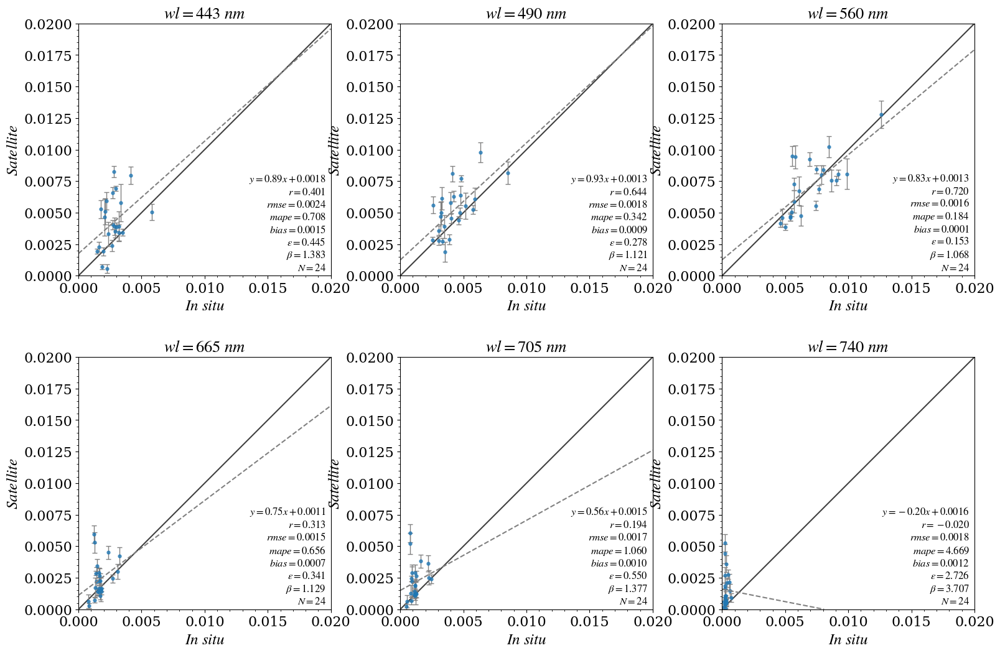

In [51]:
sat_var='Rrs_median'
insitu_var= 'isRrs_nadir_median'
xmin,xmax=0,0.02


rows=2
cols=3
u = grstbx.utils
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*5+1, rows * 5+1.))  # ,sharey=True
fig.subplots_adjust(hspace=0.275, wspace=0.275,left=0.065, right=0.965,bottom=0.08, top=0.95)
axs=axs.ravel()
for ii, wl in enumerate(matchup_data.isel(wl=slice(0,6)).wl.values):
    ax=axs[ii]
    matchup_data_ = matchup_data.sel(wl=wl).dropna('date')
   
    x,y=matchup_data_[insitu_var].values.ravel(),matchup_data_[sat_var].values.ravel()
    
    all_values = [*x,*y]
    #xmin,xmax=np.min([0,np.min(all_values)])*1.1,np.max(all_values)*1.1

  
    ax.plot(x,y,ls='',marker='o',ms=3.5,alpha=0.75,zorder=2)
    #im2 = matchup_.groupby('station').plot.scatter(x=insitu_var,y=sat_var,ax=ax)
    ax.errorbar(x,y,
    #            xerr=matchup[insitu_var.replace('mean','std')].values.ravel(),
                yerr=matchup_data_['Rrs_std'].values.ravel(),
                color='gray',fmt='none',lw=1, capsize=3,zorder=1)# ecolor=resdf.spm_norm, zorder=9)

    add_stats(x,y,ax,label=True)

    ax.set_xlim([xmin,xmax])
    ax.set_ylim([xmin,xmax])
    ax.minorticks_on()
    

    ax.set_title(r'$wl='+str(wl)+'\ nm$')
    ax.set_xlabel(r'$In\ situ\ $')
    ax.set_ylabel(r'$Satellite\ $')


for ax in axs.ravel():
    u.Plotting.set_layout(ax)

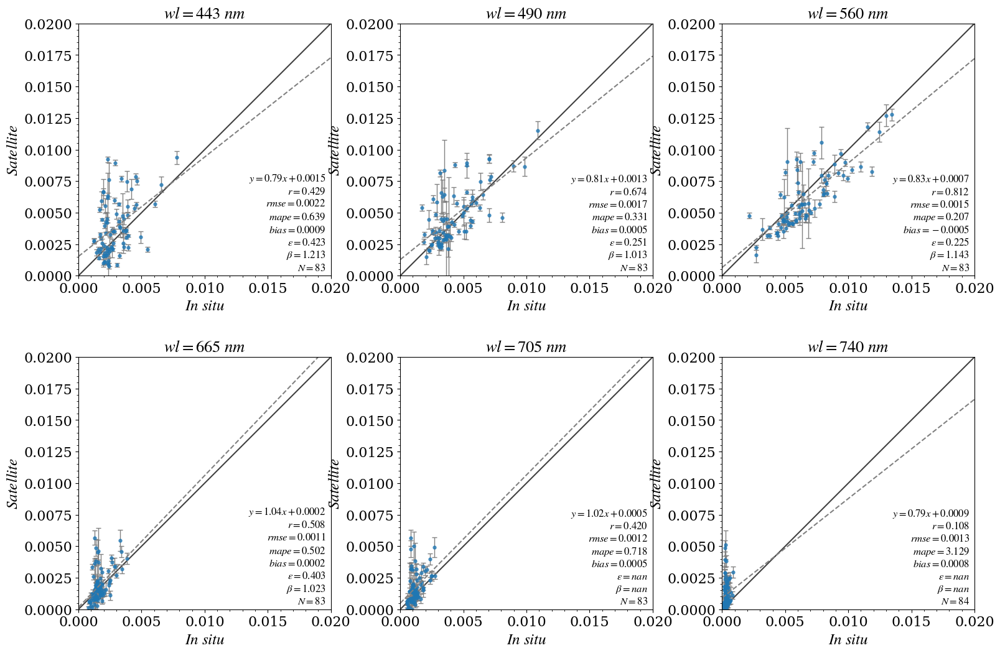

In [54]:
sat_var='Rrs_median'
insitu_var= 'isRrs_corr_median'
xmin,xmax=0,0.02


rows=2
cols=3
u = grstbx.utils
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*5+1, rows * 5+1.))  # ,sharey=True
fig.subplots_adjust(hspace=0.275, wspace=0.275,left=0.065, right=0.965,bottom=0.08, top=0.95)
axs=axs.ravel()
for ii, wl in enumerate(matchup_data.isel(wl=slice(0,6)).wl.values):
    ax=axs[ii]
    matchup_data_ = matchup_data.sel(wl=wl).dropna('date')
   
    x,y=matchup_data_[insitu_var].values.ravel(),matchup_data_[sat_var].values.ravel()
    
    all_values = [*x,*y]
    #xmin,xmax=np.min([0,np.min(all_values)])*1.1,np.max(all_values)*1.1

  
    ax.plot(x,y,ls='',marker='o',ms=3.5,alpha=0.75,zorder=2)
    #im2 = matchup_.groupby('station').plot.scatter(x=insitu_var,y=sat_var,ax=ax)
    ax.errorbar(x,y,
    #            xerr=matchup[insitu_var.replace('mean','std')].values.ravel(),
                yerr=matchup_data_['Rrs_std'].values.ravel(),
                color='gray',fmt='none',lw=1, capsize=3,zorder=1)# ecolor=resdf.spm_norm, zorder=9)

    add_stats(x,y,ax,label=True)

    ax.set_xlim([xmin,xmax])
    ax.set_ylim([xmin,xmax])
    ax.minorticks_on()
    

    ax.set_title(r'$wl='+str(wl)+'\ nm$')
    ax.set_xlabel(r'$In\ situ\ $')
    ax.set_ylabel(r'$Satellite\ $')


for ax in axs.ravel():
    u.Plotting.set_layout(ax)

Text(0.5, 1.0, 'After anisotropy correction')

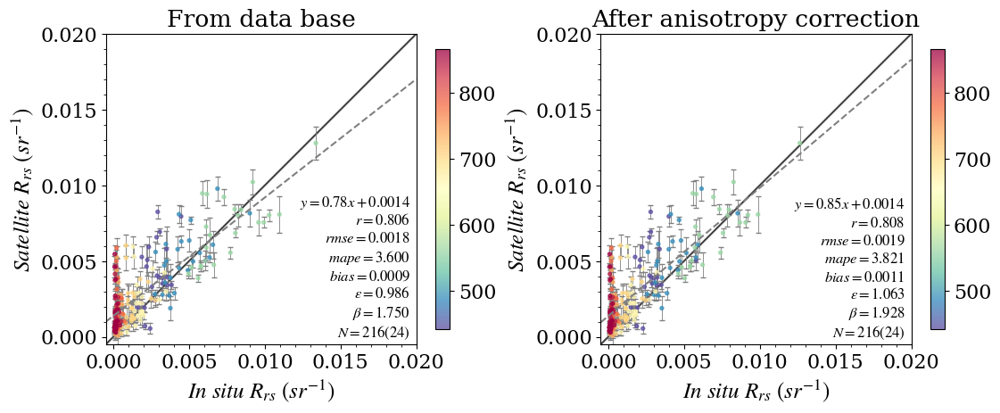

In [52]:
matchup_df_ = matchup_df.dropna()
cmap = plt.cm.Spectral_r

norm = mpl.colors.Normalize(vmin=440, vmax=800)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)



sat_var='Rrs_median'
insitu_vars= ['isRrs_corr_mean','isRrs_nadir_mean']
rows=1
cols=2
xmin,xmax=-0.0005,0.02
u = grstbx.utils
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*5+1, rows * 5+1.))  # ,sharey=True
fig.subplots_adjust(hspace=0.275, wspace=0.275,left=0.065, right=0.965,bottom=0.08, top=0.95)
axs=axs.ravel()
for ii in range(2):
    ax=axs[ii]
    insitu_var=insitu_vars[ii]
    #matchup_data_ = matchup_data.sel(wl=wl).dropna('time')
   
    x,y,wl=matchup_df_[insitu_var].values,matchup_df_[sat_var].values,matchup_df_['wl'].values
    
    all_values = [*x,*y]
   

  
    g=ax.scatter(x,y,alpha=0.75,s=8,zorder=2,c=wl,cmap=cmap)
    #im2 = matchup_.groupby('station').plot.scatter(x=insitu_var,y=sat_var,ax=ax)
    ax.errorbar(x,y,
    #            xerr=matchup[insitu_var.replace('mean','std')].values.ravel(),
                yerr=matchup_df_['Rrs_std'].values,
                color='gray',fmt='none',lw=0.6, capsize=2,zorder=1)# ecolor=resdf.spm_norm, zorder=9)

    add_stats(x,y,ax,label=True,Nbands=9)

    ax.set_xlim([xmin,xmax])
    ax.set_ylim([xmin,xmax])
    ax.minorticks_on()
    cbar = fig.colorbar(g, shrink=0.6)

   # ax.set_title(r'$wl='+str(wl)+'\ nm$')
    ax.set_xlabel(r'$In\ situ\ R_{rs}\ (sr^{-1})$')
    ax.set_ylabel(r'$Satellite\ R_{rs}\ (sr^{-1})$')

ax.set_xlim([xmin,xmax])
ax.set_ylim([xmin,xmax])

for ax in axs.ravel():
    u.Plotting.set_layout(ax)

axs[0].set_title('From data base')
axs[1].set_title('After anisotropy correction')



Text(0.5, 1.0, 'After anisotropy correction')

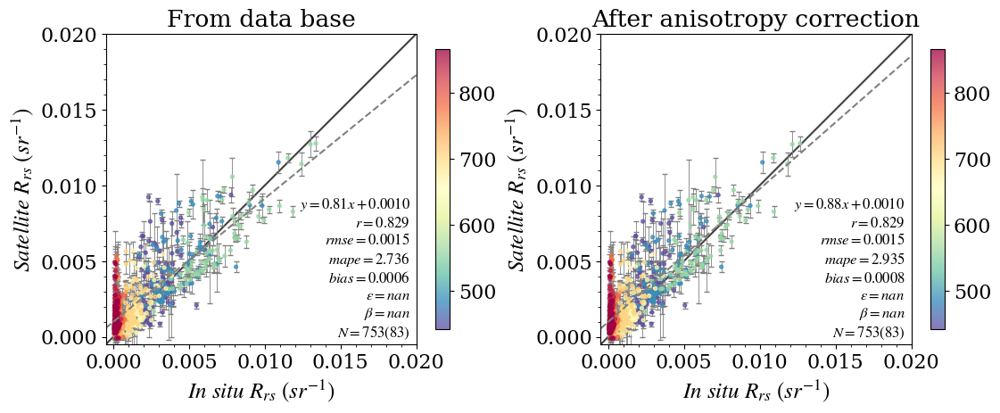

In [55]:
matchup_df_ = matchup_df.dropna()
cmap = plt.cm.Spectral_r

norm = mpl.colors.Normalize(vmin=440, vmax=800)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)



sat_var='Rrs_median'
insitu_vars= ['isRrs_corr_mean','isRrs_nadir_mean']
rows=1
cols=2
xmin,xmax=-0.0005,0.02
u = grstbx.utils
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*5+1, rows * 5+1.))  # ,sharey=True
fig.subplots_adjust(hspace=0.275, wspace=0.275,left=0.065, right=0.965,bottom=0.08, top=0.95)
axs=axs.ravel()
for ii in range(2):
    ax=axs[ii]
    insitu_var=insitu_vars[ii]
    #matchup_data_ = matchup_data.sel(wl=wl).dropna('time')
   
    x,y,wl=matchup_df_[insitu_var].values,matchup_df_[sat_var].values,matchup_df_['wl'].values
    
    all_values = [*x,*y]
   

  
    g=ax.scatter(x,y,alpha=0.75,s=8,zorder=2,c=wl,cmap=cmap)
    #im2 = matchup_.groupby('station').plot.scatter(x=insitu_var,y=sat_var,ax=ax)
    ax.errorbar(x,y,
    #            xerr=matchup[insitu_var.replace('mean','std')].values.ravel(),
                yerr=matchup_df_['Rrs_std'].values,
                color='gray',fmt='none',lw=0.6, capsize=2,zorder=1)# ecolor=resdf.spm_norm, zorder=9)

    add_stats(x,y,ax,label=True,Nbands=9)

    ax.set_xlim([xmin,xmax])
    ax.set_ylim([xmin,xmax])
    ax.minorticks_on()
    cbar = fig.colorbar(g, shrink=0.6)

   # ax.set_title(r'$wl='+str(wl)+'\ nm$')
    ax.set_xlabel(r'$In\ situ\ R_{rs}\ (sr^{-1})$')
    ax.set_ylabel(r'$Satellite\ R_{rs}\ (sr^{-1})$')

ax.set_xlim([xmin,xmax])
ax.set_ylim([xmin,xmax])

for ax in axs.ravel():
    u.Plotting.set_layout(ax)

axs[0].set_title('From data base')
axs[1].set_title('After anisotropy correction')



Text(0.5, 1.0, 'After anisotropy correction')

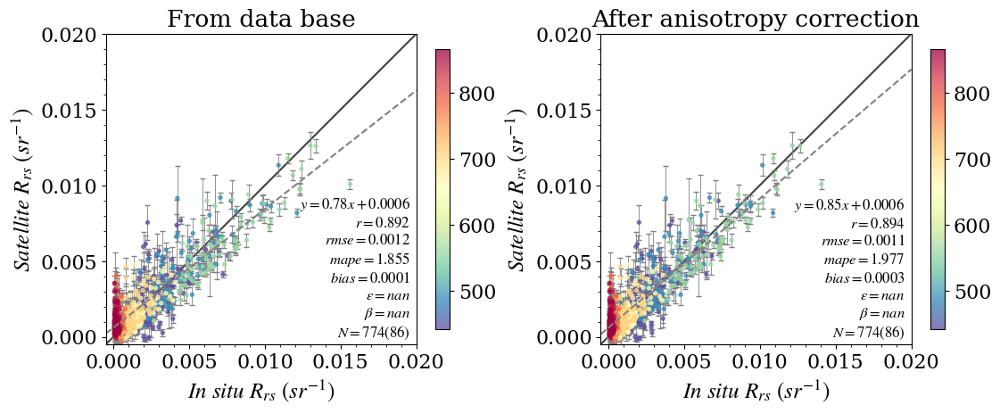

In [114]:
matchup_df_ = matchup_df.dropna()
cmap = plt.cm.Spectral_r

norm = mpl.colors.Normalize(vmin=440, vmax=800)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)



sat_var='Rrs_median'
insitu_vars= ['isRrs_corr_mean','isRrs_nadir_mean']
rows=1
cols=2
xmin,xmax=-0.0005,0.02
u = grstbx.utils
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*5+1, rows * 5+1.))  # ,sharey=True
fig.subplots_adjust(hspace=0.275, wspace=0.275,left=0.065, right=0.965,bottom=0.08, top=0.95)
axs=axs.ravel()
for ii in range(2):
    ax=axs[ii]
    insitu_var=insitu_vars[ii]
    #matchup_data_ = matchup_data.sel(wl=wl).dropna('time')
   
    x,y,wl=matchup_df_[insitu_var].values,matchup_df_[sat_var].values,matchup_df_['wl'].values
    
    all_values = [*x,*y]
   

  
    g=ax.scatter(x,y,alpha=0.75,s=8,zorder=2,c=wl,cmap=cmap)
    #im2 = matchup_.groupby('station').plot.scatter(x=insitu_var,y=sat_var,ax=ax)
    ax.errorbar(x,y,
    #            xerr=matchup[insitu_var.replace('mean','std')].values.ravel(),
                yerr=matchup_df_['Rrs_std'].values,
                color='gray',fmt='none',lw=0.6, capsize=2,zorder=1)# ecolor=resdf.spm_norm, zorder=9)

    add_stats(x,y,ax,label=True,Nbands=9)

    ax.set_xlim([xmin,xmax])
    ax.set_ylim([xmin,xmax])
    ax.minorticks_on()
    cbar = fig.colorbar(g, shrink=0.6)

   # ax.set_title(r'$wl='+str(wl)+'\ nm$')
    ax.set_xlabel(r'$In\ situ\ R_{rs}\ (sr^{-1})$')
    ax.set_ylabel(r'$Satellite\ R_{rs}\ (sr^{-1})$')

ax.set_xlim([xmin,xmax])
ax.set_ylim([xmin,xmax])

for ax in axs.ravel():
    u.Plotting.set_layout(ax)

axs[0].set_title('From data base')
axs[1].set_title('After anisotropy correction')



In [28]:
#good_dates = stats.where(stats.rel_pix_num>0.2,drop=True).time.values

AttributeError: 'list' object has no attribute 'where'

In [ ]:
#stats.sel(time=good_dates)['median'].plot(hue='time',marker='o',ms=3,color='k',alpha=0.5,add_legend=False)
#plt.show()

In [ ]:
stats.where(stats.rel_pix_num>0.2,drop=True)

In [ ]:
sat_time = stats.where(stats.rel_pix_num>0.2,drop=True).time#.reset_coords(drop=True)
sat_time.name = 'sat_time'

insitu_data = hypernets #ds
insitu_time = insitu_data.time
insitu_time.name = 'insitu_time'


In [ ]:
matchup_time = pd.merge_asof(
    sat_time.to_dataframe(),
    insitu_time.to_dataframe(),
    tolerance=pd.Timedelta("2h"),left_index=True, right_index=True).dropna()
matchup_time


In [ ]:
stats.time.dt.floor('1D')

In [ ]:

def get_daily(ds):
    ds['time'] = ds.time.dt.floor('1D')
    
    # group by 'date' using an average (mean)
    return ds.groupby('time').mean()
get_daily(stats.sel(time=matchup_time['sat_time'].values))

In [27]:
insitu_data#.interp(wl=xmatchup.wl)

<xarray.Dataset> Size: 153MB
Dimensions:                     (time: 1876, wl: 1019)
Coordinates:
  * wl                          (wl) float64 8kB 399.8 400.3 ... 898.9 899.4
  * time                        (time) datetime64[ns] 15kB 2021-02-24T11:33:4...
    var                         <U4 16B 'bb_a'
    level                       int64 8B 1
    model                       <U8 32B 'grow_pow'
    azi                         int64 8B 90
    dataset                     <U15 60B 'Ciotti2002_Sf03'
    sza                         (time) float64 15kB 52.88 52.76 ... 60.9 52.97
Data variables: (12/20)
    bandwidth                   (time, wl) float64 15MB ...
    viewing_azimuth_angle       (time) float64 15kB ...
    viewing_zenith_angle        (time) float64 15kB ...
    solar_azimuth_angle         (time) float64 15kB ...
    solar_zenith_angle          (time) float64 15kB 52.88 52.76 ... 60.9 52.97
    acquisition_time            (time) float64 15kB ...
    ...                          ...
    reflectance_std             (time, wl) float64 15MB ...
    water_leaving_radiance_std  (time, wl) float64 15MB ...
    reflectance_nosc_std        (time, wl) float64 15MB ...
    Rrs                         (time, wl) float64 15MB ...
    Rrs_corr                    (time, wl) float64 15MB 0.003861 ... 8.443e-05
    Rrs_nadir                   (time, wl) float64 15MB nan nan ... 7.789e-05
Attributes: (12/55)
    type:                             dataset
    abstract:                         The HYPERNETS project (Horizon 2020 res...
    conventions:                      CFv72, NVS2.0
    format_version:                   v01.0
    netcdf_version:                   1.6
    processor_name:                   hypernets_processor
    ...                               ...
    lineage:                          Quality assured following automated thr...
    creator_name:                     Clémence Goyens (RBINS, OD Nature, REMSEM)
    creator_email:                    https://waterhypernet.org/contact/
    history:                          Reflectance is computed by measuring th...
    site_manager:                     David Doxaran (SU, LOV, France)
    site_manager_email:               david.doxaran@imev-mer.fr

In [28]:
xmatchup = get_daily(stats.sel(time=matchup_time['sat_time'].values)) 
xmatchup

<xarray.Dataset> Size: 52kB
Dimensions:      (time: 77, wl: 9)
Coordinates:
  * wl           (wl) int64 72B 443 490 560 665 705 740 783 842 865
    spatial_ref  int64 8B 0
    quantile     float64 8B 0.25
  * time         (time) datetime64[ns] 616B 2021-02-28 2021-03-10 ... 2023-02-26
Data variables:
    median       (time, wl) float64 6kB 0.00334 0.00532 ... 0.0013 0.00104
    Rrs_q25      (time, wl) float64 6kB 0.00321 0.00516 ... 0.00108 0.00076
    Rrs_q75      (time, wl) float64 6kB 0.00347 0.00549 ... 0.00157 0.00135
    Rrs_min      (time, wl) float64 6kB 0.00272 0.00457 ... 0.00024 -0.00031
    Rrs_max      (time, wl) float64 6kB 0.00394 0.00807 ... 0.00516 0.00541
    Rrs_mean     (time, wl) float64 6kB 0.003342 0.005325 ... 0.001362 0.001097
    Rrs_std      (time, wl) float64 6kB 0.0001943 0.0002532 ... 0.0005233
    sza          (time) float64 616B 53.86 49.99 34.62 ... 59.36 59.33 54.13
    aot550       (time) float64 616B 0.279 0.1438 0.1906 ... 0.1811 0.1252
    pix_num      (time, wl) float64 6kB 2.601e+03 2.601e+03 ... 2.601e+03
    rel_pix_num  (time, wl) float64 6kB 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0

In [66]:
insitu_matchup = insitu_data.sel(time=matchup_time['insitu_time'].values).load().sortby('wl')
insitu_matchup = get_daily(insitu_matchup.interpolate_na(dim="wl").interp(wl=xmatchup.wl))
insitu_matchup

NameError: name 'matchup_time' is not defined

In [30]:
matchup_data = xr.merge([xmatchup,insitu_matchup])#, join="override")
matchup_data

<xarray.Dataset> Size: 114kB
Dimensions:                     (time: 77, wl: 9)
Coordinates:
  * wl                          (wl) int64 72B 443 490 560 665 ... 783 842 865
    spatial_ref                 int64 8B 0
    quantile                    float64 8B 0.25
  * time                        (time) datetime64[ns] 616B 2021-02-28 ... 202...
    var                         <U4 16B 'bb_a'
    level                       int64 8B 1
    model                       <U8 32B 'grow_pow'
    azi                         int64 8B 90
    dataset                     <U15 60B 'Ciotti2002_Sf03'
Data variables: (12/31)
    median                      (time, wl) float64 6kB 0.00334 ... 0.00104
    Rrs_q25                     (time, wl) float64 6kB 0.00321 ... 0.00076
    Rrs_q75                     (time, wl) float64 6kB 0.00347 ... 0.00135
    Rrs_min                     (time, wl) float64 6kB 0.00272 ... -0.00031
    Rrs_max                     (time, wl) float64 6kB 0.00394 ... 0.00541
    Rrs_mean                    (time, wl) float64 6kB 0.003342 ... 0.001097
    ...                          ...
    reflectance_std             (time, wl) float64 6kB 0.000758 ... 0.0001237
    water_leaving_radiance_std  (time, wl) float64 6kB 0.3008 ... 0.008293
    reflectance_nosc_std        (time, wl) float64 6kB 0.001311 ... 6.213e-05
    Rrs                         (time, wl) float64 6kB 0.003962 ... 0.0006006
    Rrs_corr                    (time, wl) float64 6kB 0.003842 ... 0.0001782
    Rrs_nadir                   (time, wl) float64 6kB 0.003492 ... 0.0001615